
# Representation is King: The Journey to Quality Dialog Embeddings

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/drive/1KeugThIx7EXlNEudf-MNSA25BWnth9ny?usp=sharing)

The notebook omits many best practices of machine learning. The focus is on the main ideas and the practical implementation of the concepts introduced during the EuroPython talk. The notebook is best understood in conjunction with the talk.

In [ ]:
!pip3 install datasets==2.19.0 sentence_transformers==2.7.0 accelerate==0.30.0 shap==0.45.1 jupyter_black

In [1]:
%load_ext autoreload
%autoreload 2
%env PROTOCOL_BUFFERS_PYTHON_IMPLEMENTATION=python

import copy
import itertools
import logging
from functools import partial
from importlib import reload


import jupyter_black
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import shap
from datasets import DatasetDict, load_dataset
from matplotlib.ticker import FuncFormatter
from sentence_transformers import InputExample, SentenceTransformer, losses
from sentence_transformers.losses import MultipleNegativesSymmetricRankingLoss
from sentence_transformers.models import Normalize, Pooling, Transformer
from sentence_transformers.util import cos_sim
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelEncoder
from torch.utils.data import DataLoader

plt.rcParams.update({"font.size": 12})

reload(logging)
logging.basicConfig(level=logging.INFO)
jupyter_black.load()

env: PROTOCOL_BUFFERS_PYTHON_IMPLEMENTATION=python


# Data

In [2]:
N_LBL_SAMPLES = 10  # per class
N_UNLBL_SAMPLES = 15000  # total
N_VAL_SAMPLES = 50  # per class

In [3]:
# load data
hdf = load_dataset("air_dialogue")
hdf = hdf.map(
    lambda _: {"action": _["action"]["status"]},
    remove_columns=[
        "action",
        "intent",
        "timestamps",
        "expected_action",
        "search_info",
    ],
)

Map:   0%|          | 0/321459 [00:00<?, ? examples/s]

Map:   0%|          | 0/40363 [00:00<?, ? examples/s]

In [4]:
# select a subset of the data


def get_uniformly_sampled_indexes(
    array: list, n: int, seed: int | None = 42
) -> list[int]:
    """Returns `n` indexes for each unique value in the array."""
    if seed is not None:
        np.random.seed(seed)
    array = np.array(array)

    inds = []
    for value in np.unique(array):
        inds.extend(
            np.random.choice(np.where(array == value)[0], size=n, replace=False)
        )
    return inds


train_ix_labels = get_uniformly_sampled_indexes(hdf["train"]["action"], n=N_LBL_SAMPLES)
train_ix_no_labels = list(set(range(len(hdf["train"]))) - set(train_ix_labels))[
    15000 : 15000 + N_UNLBL_SAMPLES
]

hdf = DatasetDict(
    {
        "train_labels": hdf["train"].select(train_ix_labels),
        "train_no_labels": hdf["train"].select(train_ix_no_labels),
        "validation": hdf["validation"].select(
            get_uniformly_sampled_indexes(hdf["validation"]["action"], n=N_VAL_SAMPLES),
        ),
    }
)

hdf["train_no_labels"] = hdf["train_no_labels"].remove_columns("action")

In [5]:
# preprocessing the dialogue
hdf = hdf.map(
    lambda x: {
        "dialogue": [
            turn.replace("agent: ", "").replace("customer: ", "").strip()
            for turn in x["dialogue"]
        ]
    }
)
hdf = hdf.map(lambda _: {"dialogue_concat": " ".join(_["dialogue"])}, batched=False)

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

Map:   0%|          | 0/15000 [00:00<?, ? examples/s]

Map:   0%|          | 0/250 [00:00<?, ? examples/s]

Map:   0%|          | 0/50 [00:00<?, ? examples/s]

Map:   0%|          | 0/15000 [00:00<?, ? examples/s]

Map:   0%|          | 0/250 [00:00<?, ? examples/s]

In [6]:
# convert to pandas for easier manipulation
pdf = {}
for split in hdf.keys():
    pdf[split] = hdf[split].to_pandas()

In [7]:
# adjusting the dialog used in the presentation - just shortening it and adjusting the flight destinations

PRESENTATION_DIAG_ID = 5

pdf["validation"].at[PRESENTATION_DIAG_ID, "dialogue_concat"] = " ".join(
    [
        "Hi, I am George Taylor.",
        "Hello,. How shall I help you?",
        "I want to fly to PRG..to enjoy with college friends. Can you make a reservation from LCY?",
        "Please provide your journey dates?",
        "Sure, I need to fly on 06/13 and 06/15.",
        "Ticket can be booked with flight number 1010.",
        "Ok, please proceed.",
        "Ticket is booked.",
        "Thank you for your assistance.",
    ]
)

# Modelling

In [8]:
# define sentence transformer models


def build_sentence_transformer(model_id: str):
    encoder = Transformer(model_id)
    pooling = Pooling(
        encoder.get_word_embedding_dimension(),
        pooling_mode_mean_tokens=True,
    )
    model = SentenceTransformer(
        modules=[
            encoder,
            pooling,
            # the normalization layer was not shown in the presentation but is used
            Normalize(),
        ]
    )
    model.max_seq_length = 512
    return model


models = {
    "mpnet": build_sentence_transformer("microsoft/mpnet-base"),
    "sent-mpnet": build_sentence_transformer("sentence-transformers/all-mpnet-base-v2"),
    # below are provided already trained transfomers that were pushed to the huggingface model hub
    "sent-mpnet-unlbl": SentenceTransformer(
        "azikoss/all-mpnet-base-v2-airdialogue-unlabelled"  # trained on unlabelled data
    ),
    "sent-mpnet-unlbl-lbl": SentenceTransformer(
        "azikoss/all-mpnet-base-v2-airdialogue-unlabelled-and-labelled"  # trained on unlabelled and labelled data
    ),
}

Some weights of MPNetModel were not initialized from the model checkpoint at microsoft/mpnet-base and are newly initialized: ['mpnet.pooler.dense.bias', 'mpnet.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.








In [9]:
# calculate the embeddings for the dialogues
for split in ["train_labels", "validation"]:
    for model_name, model in models.items():
        pdf[split]["embedding_" + model_name] = pdf[split]["dialogue_concat"].apply(
            lambda x: model.encode(x, show_progress_bar=False)
        )

In [10]:
le = LabelEncoder()
le.fit(pdf["train_labels"]["action"])

LabelEncoder()

In [11]:
# train a logistic regression classifier on the embeddings


def train_downstream(
    df: pd.DataFrame, label_encoder: LabelEncoder, model_name: str
) -> LogisticRegression:
    y_target = label_encoder.transform(df["action"])
    cl = LogisticRegression()
    cl.fit(df["embedding_" + model_name].to_list(), y_target)
    return cl


def get_classification_report(
    df: pd.DataFrame,
    cl: LogisticRegression,
    label_encoder: LabelEncoder,
    model_name: str,
) -> str:
    y_pred = cl.predict(df["embedding_" + model_name].to_list())
    return classification_report(
        y_true=df["action"],
        y_pred=label_encoder.inverse_transform(y_pred),
        zero_division=0,
    )


for model_name in models.keys():
    cl = train_downstream(pdf["train_labels"], le, model_name)
    report = get_classification_report(
        # uncomment to use only correct samples
        # pdf["validation"].loc[pdf["validation"]["correct_sample"] == True],
        pdf["validation"],
        cl,
        le,
        model_name,
    )
    print(
        f"""=== {model_name} ===
        {report}
        """
    )

=== mpnet ===
                        precision    recall  f1-score   support

          book       0.62      0.62      0.62        50
        cancel       0.51      0.90      0.65        50
        change       0.69      0.96      0.80        50
     no_flight       0.82      0.46      0.59        50
no_reservation       0.71      0.20      0.31        50

      accuracy                           0.63       250
     macro avg       0.67      0.63      0.59       250
  weighted avg       0.67      0.63      0.59       250

        
=== sent-mpnet ===
                        precision    recall  f1-score   support

          book       0.60      0.64      0.62        50
        cancel       0.70      0.98      0.82        50
        change       0.89      1.00      0.94        50
     no_flight       0.69      0.58      0.63        50
no_reservation       0.97      0.56      0.71        50

      accuracy                           0.75       250
     macro avg       0.77      0.75      

## Training



### Training with unlabelled data

In [27]:
def create_turn_pairs(dataset: pd.DataFrame) -> list[InputExample]:
    """Creates pairs of consecutive turns from the dataset."""
    pairs = []
    for turns in dataset["dialogue"].to_list():
        for i in range(len(turns) - 1):
            pairs.append(InputExample(texts=[turns[i], turns[i + 1]]))
    return pairs


train_pairs = create_turn_pairs(pdf["train_no_labels"])
valid_pairs = create_turn_pairs(pdf["validation"])

# print some examples
print(f"Number of train pairs: {len(train_pairs):,}\n")
for pair in train_pairs[:5]:
    print(f"{pair.texts[0]} <----> {pair.texts[1]}")

Number of train pairs: 177,840

Hello. <----> Hi.
Hi. <----> Pamela Campbell here.
Pamela Campbell here. <----> How may help you?
How may help you? <----> I want to watch bullfight in Washington. can you book my ticket from LAS to DCA please? My travelling dates are from 11/09 to 11/11.
I want to watch bullfight in Washington. can you book my ticket from LAS to DCA please? My travelling dates are from 11/09 to 11/11. <----> Jet blue airlines is matching you with 1003 flight number, can I book flight for you?


In [ ]:
model = copy.deepcopy(models["sent-mpnet"])

loss = MultipleNegativesSymmetricRankingLoss(model)
model.fit(
    train_objectives=[(DataLoader(train_pairs, batch_size=64, shuffle=True), loss)],
    epochs=1,
    warmup_steps=250,
    save_best_model=False,
	# the model was trained with with some custom evaluators tracking the performance of the model
	# the evaluators are not includes here as they were not shown in the presentation
    # evaluator=
)

# uncomment to push it to HuggingFace
# model.push_to_hub(
#     "all-mpnet-base-v2-airdialogue-unlabelled",
#     commit_message="all-mpnet-base-v2 trained on air dialogue unlabelled data",
# )

## Training with labelled data

In [12]:
# Create combinations of pairs for contrastive training
# pairs with the same action have label 1, pairs with different actions have label 0

pairs = []
labels = []

actions = pdf["train_labels"]["action"].unique()
for action_ix in range(len(actions)):

    df_action = pdf["train_labels"].loc[
        pdf["train_labels"]["action"] == actions[action_ix]
    ]
    # pairs within the same action
    pairs_action = list(
        itertools.combinations(df_action["dialogue_concat"].tolist(), 2)
    )
    pairs.extend(pairs_action)
    labels += [1] * len(pairs_action)

    # pairs between different actions

    df_other = pdf["train_labels"].loc[
        pdf["train_labels"]["action"].isin(actions[action_ix + 1 :])
    ]
    if len(df_other) > 0:
        # it might be beneficial to have the same number of pairs with different actions
        pairs_others = list(
            itertools.product(
                df_action["dialogue_concat"].tolist(),
                df_other["dialogue_concat"].tolist(),
            )
        )
        pairs.extend(pairs_others)
        labels += [0] * len(pairs_others)

# label distribution
pd.Series(labels).value_counts()

0    1000
1     225
Name: count, dtype: int64

In [13]:
# convert the data to SentenceTransfomer (<3.0.0) format
train_dataset = []
for (sent1, sent2), label in zip(pairs, labels):
    train_dataset.append(InputExample(texts=[sent1, sent2], label=label))

In [ ]:
model = copy.deepcopy(models["sent-mpnet-unlbl"])

loss = losses.ContrastiveLoss(model)
model.fit(
    train_objectives=[(DataLoader(train_dataset, batch_size=64, shuffle=True), loss)],
    epochs=5,
    warmup_steps=0,
    save_best_model=False,
)

# uncomment to push it to HuggingFace
# model.push_to_hub(
#     "all-mpnet-base-v2-airdialogue-unlabelled-and-labelled",
#     commit_message="Finetuned `azikoss/all-mpnet-base-v2-airdialogue-unlabelled` on air dialogue labelled data",
# )

Epoch:   0%|          | 0/5 [00:00<?, ?it/s]

Iteration:   0%|          | 0/20 [00:00<?, ?it/s]

Iteration:   0%|          | 0/20 [00:00<?, ?it/s]

Iteration:   0%|          | 0/20 [00:00<?, ?it/s]

Iteration:   0%|          | 0/20 [00:00<?, ?it/s]

Iteration:   0%|          | 0/20 [00:00<?, ?it/s]

# Interpretability / Intuition

Understanding the predictions with SHAP.

In [14]:
# select the dialogs to be placed into shap
explain_dialogs = pdf["validation"].iloc[
    PRESENTATION_DIAG_ID : PRESENTATION_DIAG_ID + 1
]

In [15]:
# using `shap` to explain the pipeline
def get_probabs(
    dialog: str, model: SentenceTransformer, cl: LogisticRegression
) -> np.ndarray:
    outputs = model.encode(dialog, show_progress_bar=False)
    return cl.predict_proba(outputs)


def print_explanation(
    diag: pd.Series,
    model_name: str,
    shap_val: shap.Explanation,
    cl: LogisticRegression,
    le: LabelEncoder,
):
    probs = cl.predict_proba(diag["embedding_" + model_name].reshape(1, -1))[0]

    print(
        f"""=== {model_name} === 
        True: {diag['action']}
        Predicted: {le.inverse_transform([probs.argmax()])[0]}
        Probs: {', '.join([f'{x:.1%}' for x in probs])}
        """
    )

    shap.plots.text(
        shap_val,
    )


for model_name, model in models.items():
    cl = train_downstream(pdf["train_labels"], le, model_name)

    explainer = shap.Explainer(
        partial(get_probabs, model=model, cl=cl),
        model.tokenizer,
        output_names=pdf["train_labels"]["action"].unique(),
        seed=42,
    )

    shap_values = explainer(
        explain_dialogs["dialogue_concat"],
        fixed_context=1,
    )

    for i, (_, diag) in enumerate(explain_dialogs.iterrows()):
        print_explanation(diag, model_name, shap_values[i], cl, le)

=== mpnet === 
        True: book
        Predicted: book
        Probs: 20.5%, 19.3%, 20.1%, 20.2%, 19.8%
        


=== sent-mpnet === 
        True: book
        Predicted: no_flight
        Probs: 17.4%, 11.4%, 20.5%, 31.9%, 18.9%
        


=== sent-mpnet-unlbl === 
        True: book
        Predicted: no_flight
        Probs: 27.2%, 12.7%, 18.0%, 27.9%, 14.3%
        


=== sent-mpnet-unlbl-lbl === 
        True: book
        Predicted: book
        Probs: 76.6%, 4.0%, 7.1%, 9.3%, 3.0%
        


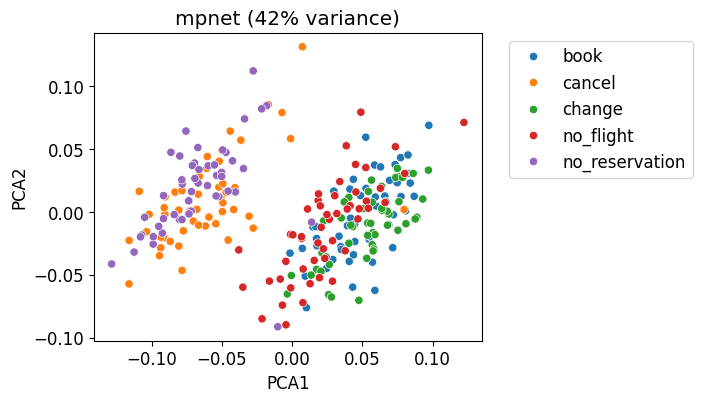

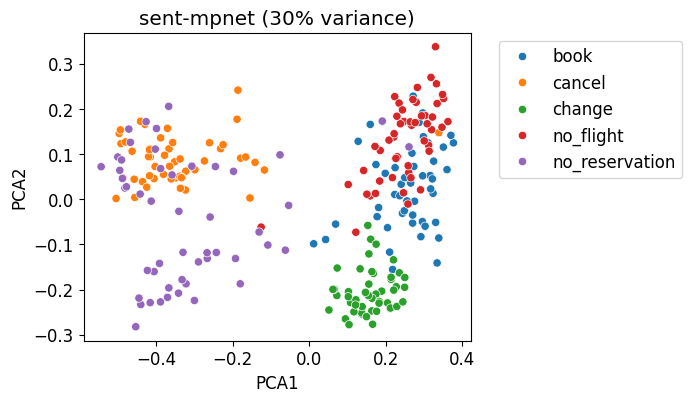

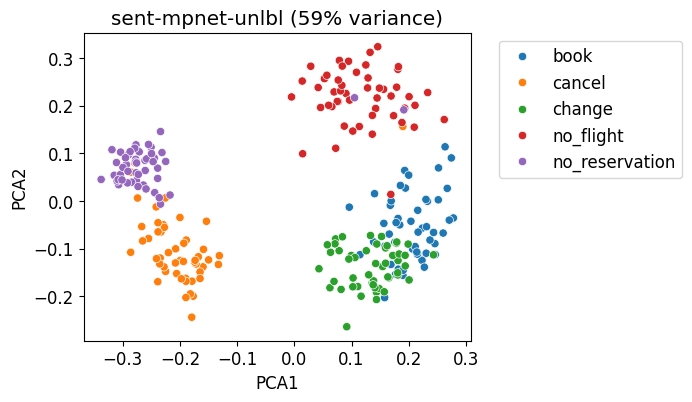

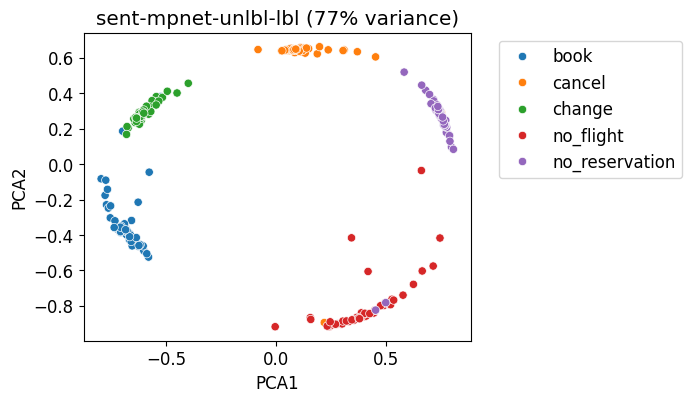

In [16]:
# visualizing the embeddings using PCA

for model_name in models.keys():
    reducer = PCA(n_components=2, random_state=42).fit(
        pdf["validation"]["embedding_" + model_name].to_list()
    )
    emb_red = reducer.transform(pdf["validation"]["embedding_" + model_name].to_list())

    _, ax = plt.subplots(figsize=(5, 4))
    ax = sns.scatterplot(
        x=emb_red[:, 0],
        y=emb_red[:, 1],
        hue=pdf["validation"]["action"].to_list(),
        ax=ax,
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")

    ax.set_xlabel("PCA1")
    ax.set_ylabel("PCA2")
    ax.set_title(
        f"{model_name} ({reducer.explained_variance_ratio_.sum():.0%} variance)"
    )
    plt.show()

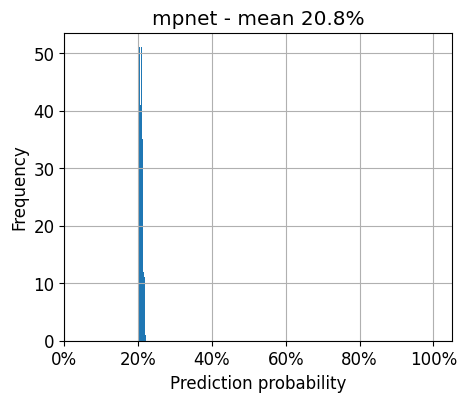

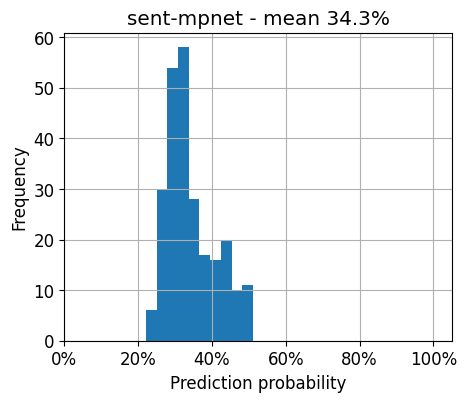

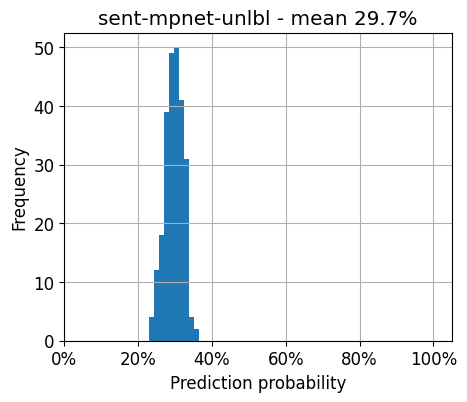

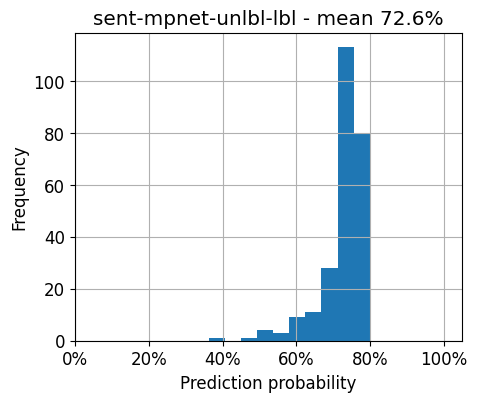

In [ ]:
# visualizing the maximum prediction probability

for model_name in models.keys():
    cl = train_downstream(pdf["train_labels"], le, model_name)
    _, ax = plt.subplots(figsize=(5, 4))
    probs = pd.Series(
        cl.predict_proba(pdf["validation"]["embedding_" + model_name].to_list()).max(
            axis=1
        )
    )
    probs.hist(ax=ax)

    ax.set_xlim(0, 1.05)
    ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{x*100:.0f}%"))
    ax.set_xlabel("Prediction probability")
    ax.set_ylabel("Frequency")
    ax.set_title(f"{model_name} - mean {probs.mean():.1%}")
    plt.show()

## Cosine similarity examples

These are the cosine similarity examples used in the talk.


In [17]:
for model_name in models.keys():
    print(model_name)
    print(
        cos_sim(
            models[model_name].encode("I want to fly to Prague."),
            models[model_name].encode("I don't want to fly to Prague."),
        ),
        cos_sim(
            models[model_name].encode("I want to fly to Prague."),
            models[model_name].encode("I would like to travel to Prague by plane."),
        ),
        cos_sim(
            models[model_name].encode("I want to fly to Prague."),
            models[model_name].encode("Sparta Prague is the best."),
        ),
    )

mpnet
tensor([[0.9850]]) tensor([[0.9843]]) tensor([[0.8955]])
sent-mpnet
tensor([[0.7419]]) tensor([[0.8561]]) tensor([[0.4553]])
sent-mpnet-unlbl
tensor([[0.9257]]) tensor([[0.9221]]) tensor([[0.9047]])
sent-mpnet-unlbl-lbl
tensor([[0.8328]]) tensor([[0.6693]]) tensor([[0.7499]])


In [18]:
cos_sim(
    models["mpnet"].encode("What is the best club?"),
    models["mpnet"].encode("I would like to travel to Prague by plane."),
), cos_sim(
    models["mpnet"].encode("What is the best club?"),
    models["mpnet"].encode("Sparta Prague is the best."),
)

(tensor([[0.9087]]), tensor([[0.8858]]))